c:\Users\Raymond Tie\Desktop\NILM\.venv\Lib\site-packages\nilmtk\utils.py:501: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  return fill_method(how(data.resample(rule, **resample_kwargs)))


TVDR-TDWS Implementation with NILMTK Integration
Appliance: kettle
Sampling Rate: 16.0kHz
Voltage: 325V peak (229.8V RMS)
Window Size: 8 cycles (160ms)
Loading NILMTK dataset...
Loading high-frequency data...
Error loading NILMTK data: 'ElecMeter' object has no attribute 'voltage'
Falling back to simulated data...
Generating simulated data...
Generated 160000 samples of simulated data

Processing 5 events...


Processing events:   0%|          | 0/5 [00:00<?, ?it/s]


Plotting event 1...


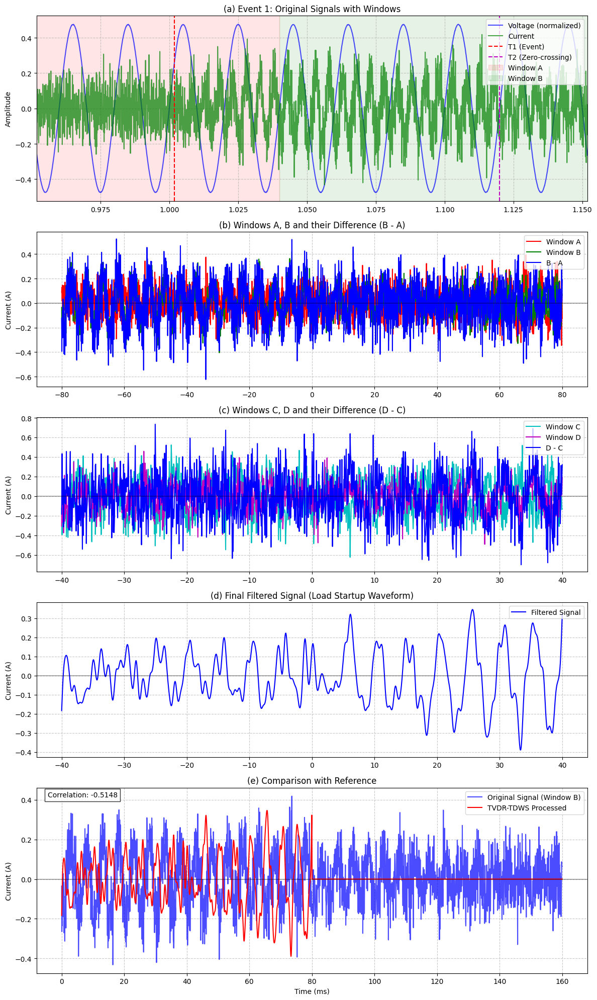

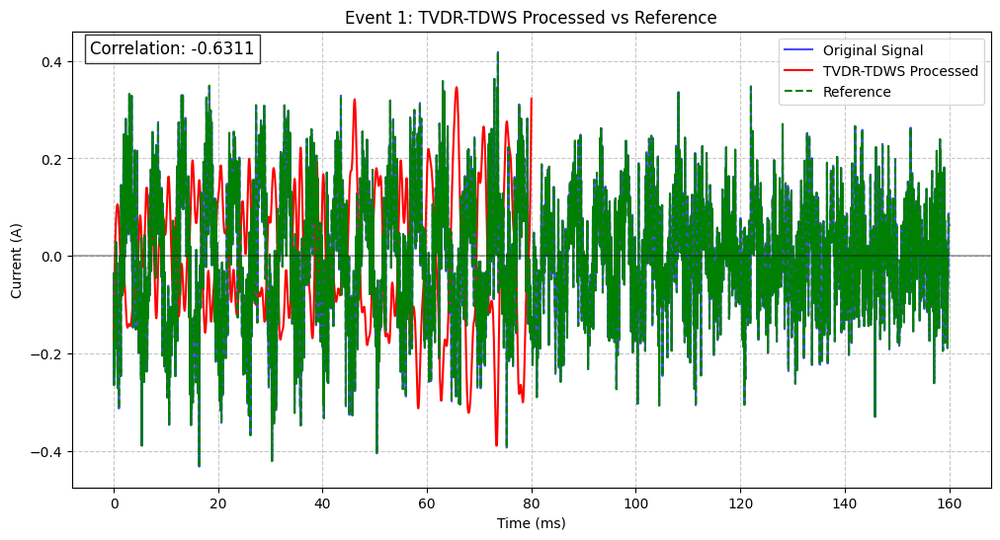

Processing events:  20%|██        | 1/5 [00:06<00:26,  6.66s/it]


Plotting event 2...


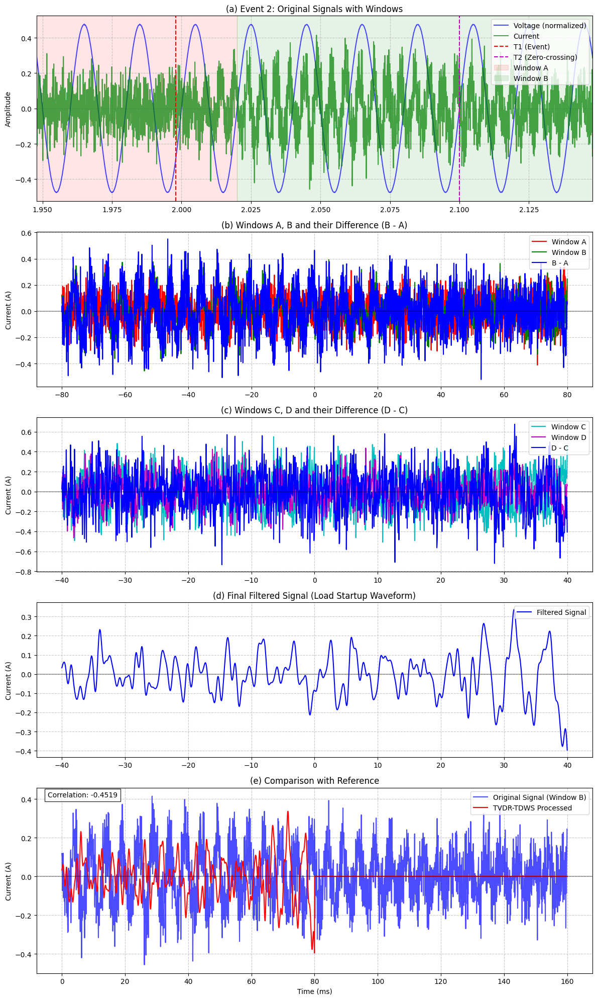

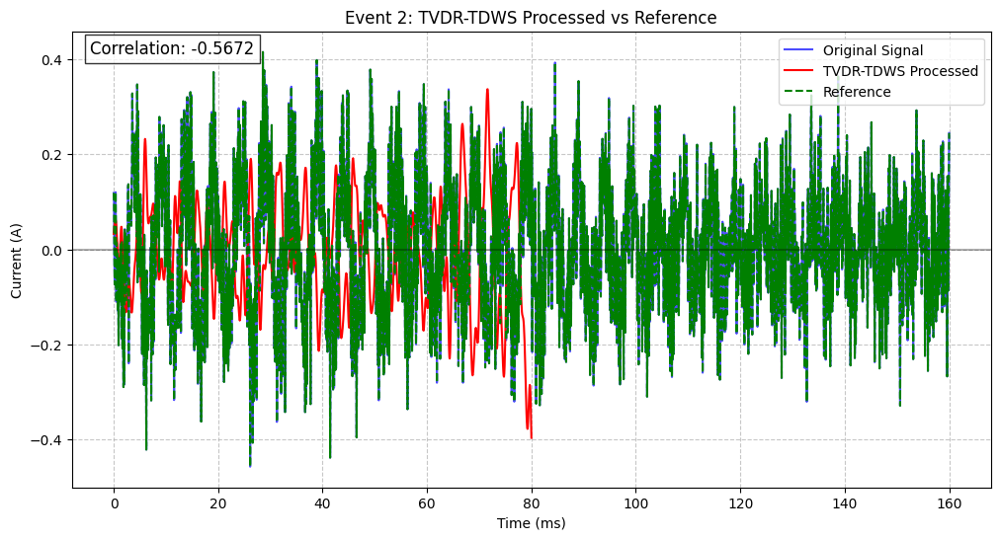

Processing events:  40%|████      | 2/5 [00:20<00:32, 10.97s/it]


Plotting event 3...


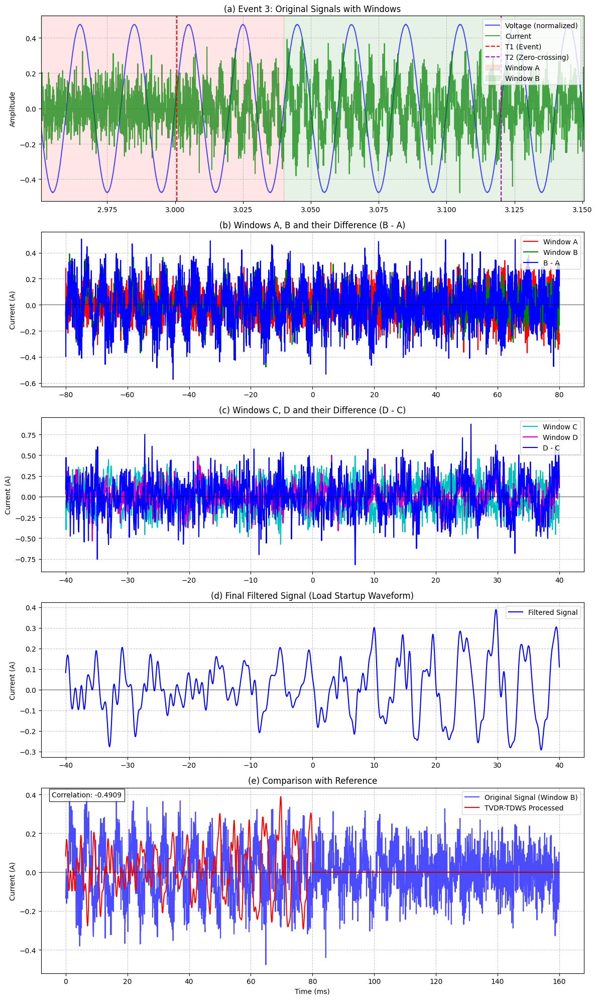

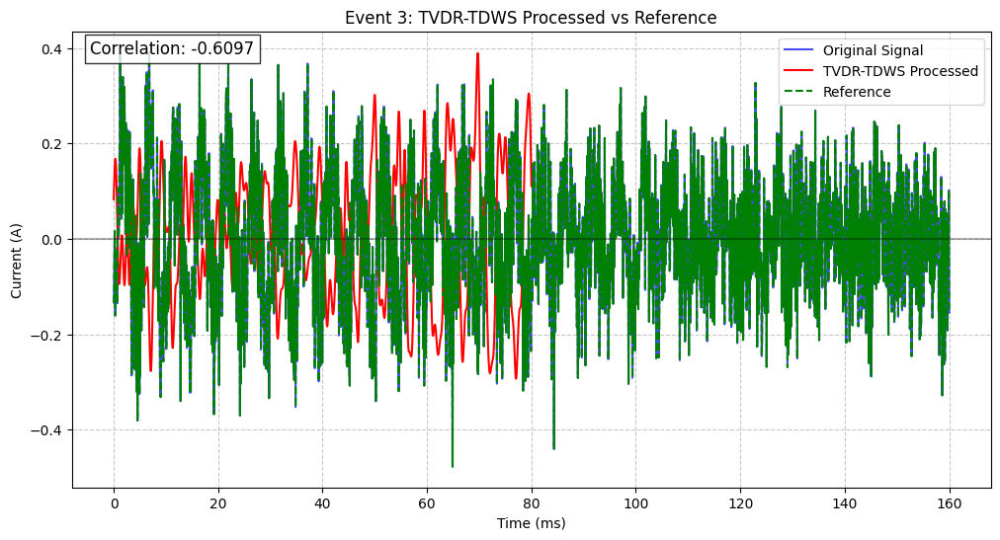

Processing events:  60%|██████    | 3/5 [00:43<00:32, 16.31s/it]


Plotting event 4...


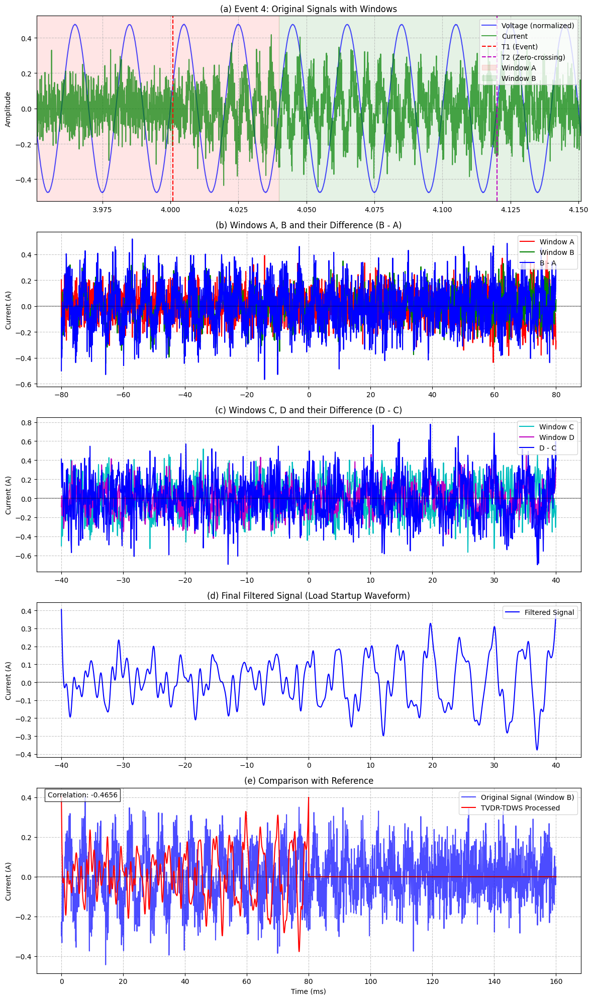

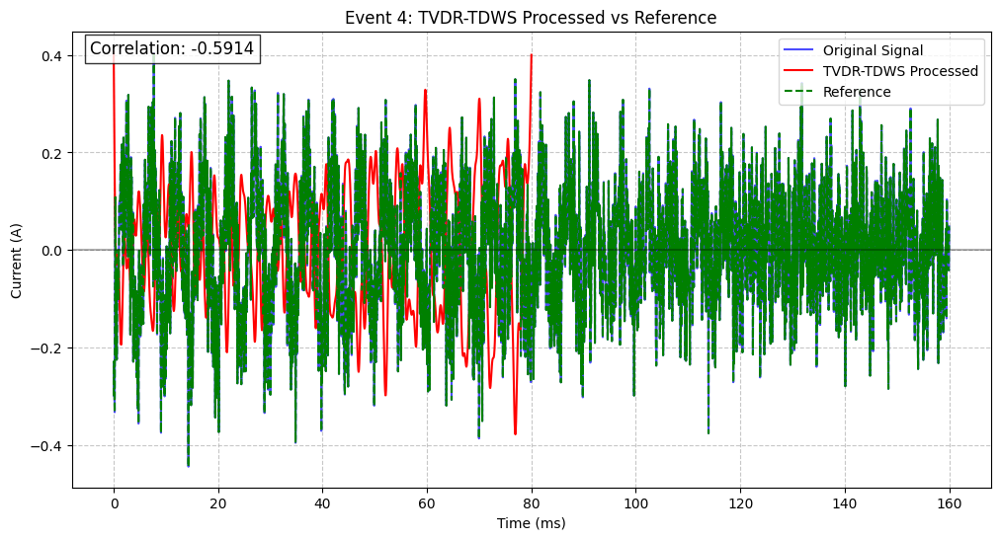

Processing events:  80%|████████  | 4/5 [00:57<00:15, 15.66s/it]


Plotting event 5...


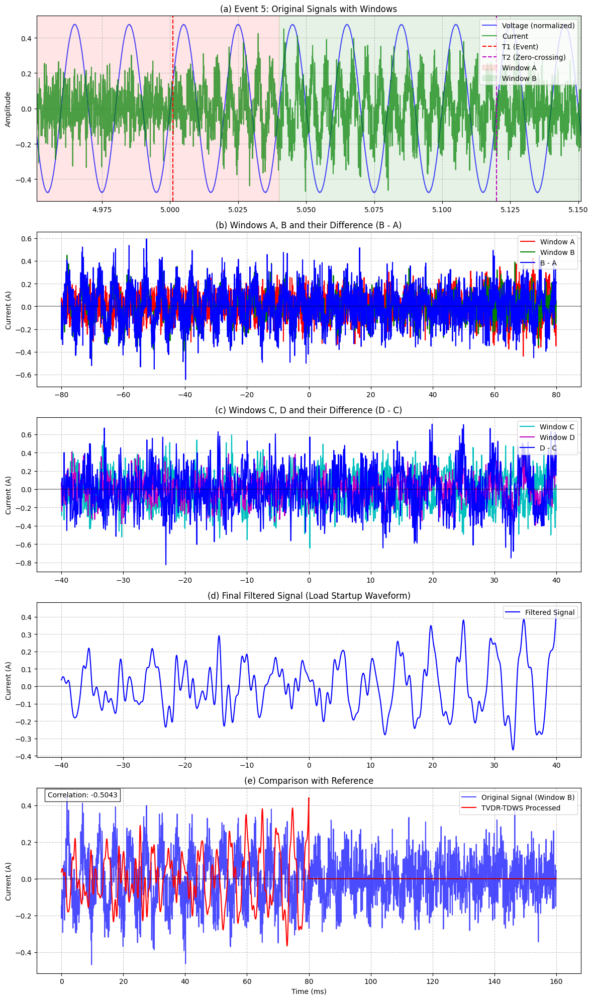

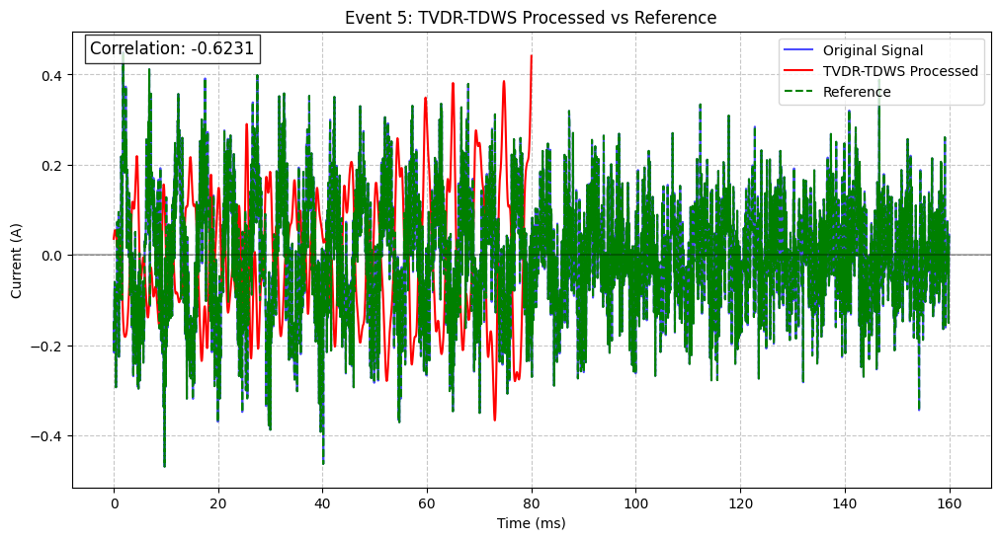

Processing events: 100%|██████████| 5/5 [01:13<00:00, 14.63s/it]


PROCESSING SUMMARY

 Event   T1 (s)   T2 (s) T2-T1 (ms) RMS A (A) RMS B (A) RMS B-A (A) RMS D-C (A) RMS Filtered (A)
     1 1.001812 1.119999     118.19    0.1080    0.1338      0.1710      0.2382           0.1369
     2 1.997875 2.099999     102.12    0.1037    0.1382      0.1726      0.2215           0.1104
     3 3.000625 3.120000     119.38    0.1080    0.1334      0.1688      0.2323           0.1336
     4 4.000875 4.119998     119.12    0.1094    0.1290      0.1635      0.2233           0.1286
     5 5.001000 5.120000     119.00    0.1108    0.1340      0.1695      0.2381           0.1444

Results saved to: results\tvdr_tdws_summary_20251005_112518.csv

TVDR-TDWS processing completed!


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from nilmtk import DataSet
from nilmtk.utils import get_datastore
import os
from datetime import datetime
from tqdm import tqdm
from matplotlib.gridspec import GridSpec
from typing import Tuple, Dict, Any, Optional, List

# ===========================================
# CONFIGURATION
# ===========================================
config = {
    # Data source
    'dataset_path': r"C:\Users\Raymond Tie\Desktop\NILM\datasets\ukdale.h5",
    'building': 1,
    'appliance': "kettle",
    
    # Signal parameters (from paper)
    'sampling_rate': 16000,    # 16kHz for UK-DALE
    'voltage_freq': 50,        # 50Hz grid
    'voltage_peak': 325,       # 230V RMS → 325V peak
    'window_cycles': 8,        # 8 voltage cycles per window
    'lpf_cutoff': 1000,        # 1kHz low-pass filter
    
    # Activation detection
    'on_power_threshold': 50,  # Power threshold for activation detection (W)
    'min_off_duration': 60,    # Minimum OFF duration (s)
    'min_on_duration': 60,     # Minimum ON duration (s)
    
    # Processing
    'start_time': "2013-11-08 00:00:00",
    'end_time': "2013-11-08 23:59:00",
    'max_events': 5,           # Maximum events to process
    'simulate_data': False,    # Set to True for testing
    'output_dir': 'results'    # Directory to save results
}

# Create output directory
os.makedirs(config['output_dir'], exist_ok=True)

# ===========================================
# CORE TVDR-TDWS ALGORITHM
# ===========================================
def find_zero_crossings(voltage_signal: np.ndarray) -> np.ndarray:
    """Enhanced zero-crossing detection with improved interpolation."""
    crossings = np.where((voltage_signal[:-1] <= 0) & (voltage_signal[1:] > 0))[0]
    precise_crossings = []
    for i in crossings:
        x0, x1 = i, i + 1
        y0, y1 = voltage_signal[i], voltage_signal[i + 1]
        if y0 != y1:  # Avoid division by zero
            t = x0 - y0 * (x1 - x0) / (y1 - y0)
            precise_crossings.append(t)
        else:
            precise_crossings.append(i + 0.5)
    return np.array(precise_crossings)

def get_window(signal_data: np.ndarray, center_idx: float, window_size: int) -> Tuple[np.ndarray, int, int]:
    """Extract a window of data with improved boundary handling."""
    half = window_size // 2
    start = max(0, int(round(center_idx - half)))
    end = min(len(signal_data), int(round(center_idx + half)))
    
    # Ensure consistent window size
    actual_size = end - start
    if actual_size < window_size:
        if start == 0:
            end = min(len(signal_data), start + window_size)
        else:
            start = max(0, end - window_size)
    
    return signal_data[start:end], start, end

def design_stable_filter(cutoff: float, fs: float, order: int = 4) -> Tuple[np.ndarray, np.ndarray]:
    """Design a stable IIR low-pass filter with fallback to Chebyshev if needed."""
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    
    try:
        # Try Butterworth first
        b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
        # Check stability
        if np.any(np.abs(np.roots(a)) >= 1):
            raise ValueError("Butterworth filter unstable, falling back to Chebyshev")
    except:
        # Fallback to Chebyshev Type I
        b, a = signal.cheby1(order, 0.5, normal_cutoff, btype='low', analog=False)
    
    return b, a

def process_tvdr_tdws(voltage: np.ndarray, 
                     current: np.ndarray, 
                     event_idx: int, 
                     sampling_rate: float, 
                     voltage_freq: float, 
                     window_cycles: int, 
                     lpf_cutoff: float) -> Optional[Dict[str, Any]]:
    """Enhanced TVDR-TDWS processing with improved precision and stability."""
    # Calculate window size with proper rounding
    samples_per_cycle = int(round(sampling_rate / voltage_freq))
    window_size = window_cycles * samples_per_cycle
    
    # Find zero crossings with margin
    zero_crossings = find_zero_crossings(voltage)
    if len(zero_crossings) == 0:
        return None
    
    margin = int(0.1 * sampling_rate)  # 100ms margin
    post_event_zc = zero_crossings[zero_crossings > (event_idx + margin)]
    if len(post_event_zc) == 0:
        return None
    zc_index = post_event_zc[0]
    
    # Define windows with improved boundary handling
    window_b, b_start, b_end = get_window(current, zc_index, window_size)
    window_a, a_start, a_end = get_window(current, zc_index - window_size, window_size)
    
    # Ensure windows have equal length
    min_len = min(len(window_a), len(window_b))
    if min_len < window_size // 2:
        return None
    
    window_a = window_a[:min_len]
    window_b = window_b[:min_len]
    
    # First subtraction: B - A
    diff_ba = window_b - window_a
    
    # Second subtraction: Split and subtract
    split_point = len(diff_ba) // 2
    window_c = diff_ba[:split_point]
    window_d = diff_ba[split_point:2*split_point]
    
    # Ensure equal length
    min_len = min(len(window_c), len(window_d))
    window_c = window_c[:min_len]
    window_d = window_d[:min_len]
    diff_dc = window_d - window_c
    
    # Apply stable filtering
    try:
        b, a = design_stable_filter(lpf_cutoff, sampling_rate)
        filtered_signal = signal.filtfilt(b, a, diff_dc)
    except Exception as e:
        print(f"Filtering failed: {e}")
        filtered_signal = diff_dc  # Fallback to unfiltered
    
    # Create precise time vectors
    def create_time_vector(length: int) -> np.ndarray:
        return np.linspace(-length/2, length/2, length) * 1000 / sampling_rate
    
    return {
        't1_idx': event_idx,
        't2_idx': zc_index,
        'windows': {
            'A': window_a, 'B': window_b, 
            'C': window_c, 'D': window_d,
            'diff_ba': diff_ba,
            'diff_dc': diff_dc,
            'filtered': filtered_signal
        },
        'time_vectors': {
            'ba': create_time_vector(len(diff_ba)),
            'cd': create_time_vector(len(window_c)),
            'filtered': create_time_vector(len(filtered_signal))
        },
        'indices': {
            'A': (a_start, a_start + len(window_a)),
            'B': (b_start, b_start + len(window_b))
        }
    }

# ===========================================
# ACTIVATION DETECTION
# ===========================================
def detect_activations_improved(power_series: pd.Series, 
                              sampling_rate: float,
                              **kwargs) -> Tuple[np.ndarray, pd.Series]:
    """Enhanced activation detection with precise sample index calculation."""
    # Default parameters
    params = {
        'on_power_threshold': 50,
        'min_off_duration': 60,
        'min_on_duration': 60
    }
    params.update(kwargs)
    
    # Get power series if it's a NILMTK object
    if hasattr(power_series, 'power_series'):
        power_series = next(power_series.power_series(sample_period=6))
    
    # Convert to pandas Series if it's not already
    if not isinstance(power_series, pd.Series):
        power_series = pd.Series(power_series)
    
    # Calculate power sampling rate
    if len(power_series) > 1:
        power_fs = 1 / (power_series.index[1] - power_series.index[0]).total_seconds()
    else:
        power_fs = 1/6  # Default to 1/6 Hz if we can't determine
    
    # Detect state changes
    state = (power_series > params['on_power_threshold']).astype(int)
    state_diff = np.diff(state, prepend=0)
    activations = np.where(state_diff > 0)[0]
    
    # Convert to target sampling rate
    scale_factor = sampling_rate / power_fs
    activation_indices = (activations * scale_factor).astype(int)
    
    return activation_indices, power_series

# ===========================================
# VISUALIZATION
# ===========================================
def plot_comparison(original_signal: np.ndarray, 
                   processed_signal: np.ndarray, 
                   reference_signal: np.ndarray, 
                   sampling_rate: float,
                   title: str = "Comparison of Signals", 
                   save_path: Optional[str] = None) -> None:
    """Plot comparison between original, processed, and reference signals."""
    plt.figure(figsize=(12, 6))
    
    # Create time vectors in milliseconds
    def create_time_vector(signal_data, max_samples):
        n = min(len(signal_data), max_samples)
        return np.linspace(0, n * 1000 / sampling_rate, n)
    
    max_samples = max(len(original_signal), len(processed_signal), len(reference_signal))
    t_original = create_time_vector(original_signal, max_samples)
    t_processed = create_time_vector(processed_signal, max_samples)
    t_reference = create_time_vector(reference_signal, max_samples)
    
    # Plot signals
    plt.plot(t_original[:len(original_signal)], original_signal, 'b-', alpha=0.7, label='Original Signal')
    plt.plot(t_processed[:len(processed_signal)], processed_signal, 'r-', linewidth=1.5, label='TVDR-TDWS Processed')
    plt.plot(t_reference[:len(reference_signal)], reference_signal, 'g--', linewidth=1.5, label='Reference')
    
    # Calculate and display correlation
    min_len = min(len(processed_signal), len(reference_signal))
    if min_len > 0:
        corr = np.corrcoef(processed_signal[:min_len], reference_signal[:min_len])[0, 1]
        plt.text(0.02, 0.95, f'Correlation: {corr:.4f}', 
                transform=plt.gca().transAxes, fontsize=12,
                bbox=dict(facecolor='white', alpha=0.8))
    
    # Add labels and title
    plt.xlabel('Time (ms)')
    plt.ylabel('Current (A)')
    plt.title(title)
    plt.legend(loc='upper right')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.axhline(0, color='k', linestyle='-', alpha=0.3)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

def plot_processing_steps(voltage: np.ndarray, 
                         current: np.ndarray, 
                         result: Dict[str, Any], 
                         event_num: int = 1, 
                         save_path: Optional[str] = None) -> None:
    """Plot detailed processing steps for a single event."""
    fig = plt.figure(figsize=(12, 20))
    gs = GridSpec(5, 1, height_ratios=[1.2, 1, 1, 1, 1.2])
    
    # Time vectors
    fs = config['sampling_rate']
    t_full = np.arange(len(voltage)) / fs
    t1 = result['t1_idx'] / fs
    t2 = result['t2_idx'] / fs
    
    # Plot 1: Original signals with windows
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(t_full, voltage / np.max(np.abs(voltage)) * np.max(np.abs(current)), 
             'b-', alpha=0.7, label='Voltage (normalized)')
    ax1.plot(t_full, current, 'g-', alpha=0.7, label='Current')
    ax1.axvline(t1, color='r', linestyle='--', label='T1 (Event)')
    ax1.axvline(t2, color='m', linestyle='--', label='T2 (Zero-crossing)')
    
    # Shade windows A and B
    a_start, a_end = result['indices']['A']
    b_start, b_end = result['indices']['B']
    ax1.axvspan(a_start/fs, a_end/fs, color='red', alpha=0.1, label='Window A')
    ax1.axvspan(b_start/fs, b_end/fs, color='green', alpha=0.1, label='Window B')
    
    # Formatting
    ax1.set_xlim(t1 - 0.05, t1 + 0.15)
    ax1.set_ylabel('Amplitude')
    ax1.set_title(f'(a) Event {event_num}: Original Signals with Windows')
    ax1.legend(loc='upper right')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 2: Windows A, B and B-A
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(result['time_vectors']['ba'], result['windows']['A'], 'r-', label='Window A')
    ax2.plot(result['time_vectors']['ba'], result['windows']['B'], 'g-', label='Window B')
    ax2.plot(result['time_vectors']['ba'], result['windows']['diff_ba'], 'b-', 
             label='B - A', linewidth=1.5)
    ax2.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax2.set_ylabel('Current (A)')
    ax2.set_title('(b) Windows A, B and their Difference (B - A)')
    ax2.legend(loc='upper right')
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 3: Windows C, D and D-C
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(result['time_vectors']['cd'], result['windows']['C'], 'c-', label='Window C')
    ax3.plot(result['time_vectors']['cd'], result['windows']['D'], 'm-', label='Window D')
    ax3.plot(result['time_vectors']['cd'], result['windows']['diff_dc'], 'b-', 
             label='D - C', linewidth=1.5)
    ax3.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax3.set_ylabel('Current (A)')
    ax3.set_title('(c) Windows C, D and their Difference (D - C)')
    ax3.legend(loc='upper right')
    ax3.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 4: Filtered signal
    ax4 = fig.add_subplot(gs[3])
    ax4.plot(result['time_vectors']['filtered'], 
             result['windows']['filtered'], 
             'b-', label='Filtered Signal')
    ax4.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax4.set_ylabel('Current (A)')
    ax4.set_title('(d) Final Filtered Signal (Load Startup Waveform)')
    ax4.legend(loc='upper right')
    ax4.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 5: Comparison with reference
    ax5 = fig.add_subplot(gs[4])
    reference_signal = result['windows']['B']  # Using Window B as reference
    processed_signal = np.pad(result['windows']['filtered'], 
                            (0, len(reference_signal) - len(result['windows']['filtered'])), 
                            'constant')
    
    t_original = np.arange(len(reference_signal)) * 1000 / fs
    t_processed = np.linspace(0, len(reference_signal)*1000/fs, len(processed_signal))
    
    ax5.plot(t_original, reference_signal, 'b-', alpha=0.7, label='Original Signal (Window B)')
    ax5.plot(t_processed, processed_signal, 'r-', linewidth=1.5, label='TVDR-TDWS Processed')
    
    # Calculate and display correlation
    min_len = min(len(processed_signal), len(reference_signal))
    if min_len > 0:
        corr = np.corrcoef(processed_signal[:min_len], reference_signal[:min_len])[0, 1]
        ax5.text(0.02, 0.95, f'Correlation: {corr:.4f}', 
                transform=ax5.transAxes, fontsize=10,
                bbox=dict(facecolor='white', alpha=0.8))
    
    ax5.set_xlabel('Time (ms)')
    ax5.set_ylabel('Current (A)')
    ax5.set_title('(e) Comparison with Reference')
    ax5.legend(loc='upper right')
    ax5.grid(True, linestyle='--', alpha=0.7)
    ax5.axhline(0, color='k', linestyle='-', alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# ===========================================
# DATA GENERATION AND LOADING
# ===========================================
def generate_simulated_data(duration: float = 10, 
                          sampling_rate: float = 16000, 
                          voltage_freq: float = 50, 
                          voltage_peak: float = 325) -> Tuple[pd.Series, pd.Series, pd.Series, List[int]]:
    """Generate simulated voltage and current data with transients."""
    print("Generating simulated data...")
    t = np.linspace(0, duration, int(duration * sampling_rate), endpoint=False)
    
    # Generate voltage with noise
    voltage_noise = np.random.normal(0, 0.5, len(t))
    voltage = pd.Series(
        voltage_peak * np.sin(2 * np.pi * voltage_freq * t) + voltage_noise,
        index=pd.date_range(start=datetime.now(), periods=len(t), 
                          freq=f"{1000/sampling_rate}ms")
    )
    
    # Create current with noise and transients
    current = pd.Series(
        np.random.normal(0, 0.1, len(t)),
        index=voltage.index
    )
    
    # Add activation events with random timing
    activation_indices = []
    for i in range(1, 6):
        jitter = np.random.randint(-sampling_rate//(4*voltage_freq), 
                                 sampling_rate//(4*voltage_freq))
        idx = i * sampling_rate + jitter
        if idx < len(t):
            activation_indices.append(idx)
            transient_len = sampling_rate // 2
            transient = np.linspace(0, 5, transient_len) * np.exp(-np.linspace(0, 10, transient_len))
            transient *= np.sin(2 * np.pi * 100 * np.linspace(0, 1, transient_len))
            end = min(len(current), idx + transient_len)
            current.iloc[idx:end] += transient[:end-idx]
    
    # Create dummy power data
    power_data = pd.Series(0, index=voltage.index[::sampling_rate//10])
    for idx in activation_indices:
        power_idx = idx // (sampling_rate//10)
        if power_idx < len(power_data):
            power_data.iloc[power_idx] = 2200  # 2.2kW during activation
    
    print(f"Generated {len(voltage)} samples of simulated data")
    return voltage, current, power_data, activation_indices

def load_nilmtk_data() -> Tuple[pd.Series, pd.Series, pd.Series, List[int]]:
    """Load data from NILMTK dataset."""
    print("Loading NILMTK dataset...")
    try:
        dataset = DataSet(config['dataset_path'])
        dataset.set_window(start=config['start_time'], end=config['end_time'])
        elec = dataset.buildings[config['building']].elec
        appliance = elec[config['appliance']]
        
        # Detect activations
        activation_indices, power_data = detect_activations_improved(
            appliance,
            sampling_rate=config['sampling_rate'],
            on_power_threshold=config['on_power_threshold'],
            min_off_duration=config['min_off_duration'],
            min_on_duration=config['min_on_duration']
        )
        
        # Load high-frequency data
        print("Loading high-frequency data...")
        voltage_data = next(elec.mains().voltage().load(sample_period=1/config['sampling_rate']))
        voltage = pd.Series(voltage_data.values.flatten(), index=voltage_data.index)
        
        current_data = next(elec.mains().current().load(sample_period=1/config['sampling_rate']))
        current = pd.Series(current_data.values.flatten(), index=current_data.index)
        
        return voltage, current, power_data, activation_indices.tolist()
        
    except Exception as e:
        print(f"Error loading NILMTK data: {e}")
        print("Falling back to simulated data...")
        return generate_simulated_data()

# ===========================================
# MAIN EXECUTION
# ===========================================
def main():
    print("TVDR-TDWS Implementation with NILMTK Integration")
    print("=" * 70)
    print(f"Appliance: {config['appliance']}")
    print(f"Sampling Rate: {config['sampling_rate']/1000}kHz")
    print(f"Voltage: {config['voltage_peak']}V peak ({config['voltage_peak']/np.sqrt(2):.1f}V RMS)")
    print(f"Window Size: {config['window_cycles']} cycles ({config['window_cycles']/config['voltage_freq']*1000:.0f}ms)")
    print("=" * 70)
    
    # Load or generate data
    if not config['simulate_data']:
        try:
            voltage, current, power_data, activation_indices = load_nilmtk_data()
        except Exception as e:
            print(f"Error loading data: {e}")
            print("Falling back to simulated data...")
            config['simulate_data'] = True
    
    if config['simulate_data']:
        print("Using simulated data...")
        voltage, current, power_data, activation_indices = generate_simulated_data(
            duration=10,
            sampling_rate=config['sampling_rate'],
            voltage_freq=config['voltage_freq'],
            voltage_peak=config['voltage_peak']
        )
    
    # Convert to numpy arrays for processing
    voltage_values = voltage.values
    current_values = current.values
    
    # Limit number of events to process
    max_events = min(len(activation_indices), config['max_events'])
    activation_indices = activation_indices[:max_events]
    
    if not activation_indices:
        print("No activation events found. Please check your parameters.")
        return
    
    # Process each event
    print(f"\nProcessing {len(activation_indices)} events...")
    processed_events = []
    
    for i, idx in enumerate(tqdm(activation_indices, desc="Processing events")):
        # Ensure we have enough data after the event
        if idx + 2 * config['sampling_rate'] > len(voltage_values):
            print(f"\nNot enough data after event {i+1}, skipping...")
            continue
            
        # Process using TVDR-TDWS
        result = process_tvdr_tdws(
            voltage_values, current_values, idx,
            config['sampling_rate'],
            config['voltage_freq'],
            config['window_cycles'],
            config['lpf_cutoff']
        )
        
        if result:
            processed_events.append(result)
            print(f"\nPlotting event {i+1}...")
            
            # Save processing steps plot
            plot_processing_steps(
                voltage_values, current_values, result, i+1,
                save_path=os.path.join(config['output_dir'], f'event_{i+1}_processing.png')
            )
            
            # Generate comparison plot
            reference = result['windows']['B']  # Using Window B as reference
            processed = result['windows']['filtered']
            plot_comparison(
                reference,
                processed,
                reference,  # Using same as reference for demonstration
                config['sampling_rate'],
                title=f"Event {i+1}: TVDR-TDWS Processed vs Reference",
                save_path=os.path.join(config['output_dir'], f'event_{i+1}_comparison.png')
            )
    
    # Generate summary
    if processed_events:
        print("\n" + "="*100)
        print("PROCESSING SUMMARY")
        print("="*100)
        
        summary = []
        for i, event in enumerate(processed_events, 1):
            t1 = event['t1_idx'] / config['sampling_rate']
            t2 = event['t2_idx'] / config['sampling_rate']
            t_diff = (t2 - t1) * 1000  # in ms
            
            # Calculate RMS values
            rms = lambda x: np.sqrt(np.mean(np.square(x)))
            
            summary.append({
                'Event': i,
                'T1 (s)': f"{t1:.6f}",
                'T2 (s)': f"{t2:.6f}",
                'T2-T1 (ms)': f"{t_diff:.2f}",
                'RMS A (A)': f"{rms(event['windows']['A']):.4f}",
                'RMS B (A)': f"{rms(event['windows']['B']):.4f}",
                'RMS B-A (A)': f"{rms(event['windows']['diff_ba']):.4f}",
                'RMS D-C (A)': f"{rms(event['windows']['diff_dc']):.4f}",
                'RMS Filtered (A)': f"{rms(event['windows']['filtered']):.4f}"
            })
        
        # Display summary
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 120)
        summary_df = pd.DataFrame(summary)
        print("\n" + summary_df.to_string(index=False))
        
        # Save results
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        results_file = os.path.join(config['output_dir'], f'tvdr_tdws_summary_{timestamp}.csv')
        summary_df.to_csv(results_file, index=False)
        print(f"\nResults saved to: {results_file}")
    
    print("\nTVDR-TDWS processing completed!")

if __name__ == "__main__":
    main()

TVDR-TDWS Implementation with Improved Comparison Logic
Appliance: kettle
Sampling Rate: 16.0 kHz
Voltage: 325V peak (229.8V RMS)
Window Size: 8 cycles (160.0 ms)
Using simulated data...

Processing 1 events...

Processing event 1 at index 4702...
  - T1 (Event): 4702 samples (293.88 ms)
  - T2 (Zero-crossing): 6395 samples (399.69 ms)
  - T2-T1: 105.81 ms

  Metrics:
  - Correlation with (B-A): 0.8522
  - RMSE: 0.1990
  - RMS (B-A): 1.3869 A
  - RMS Filtered: 2.1680 A


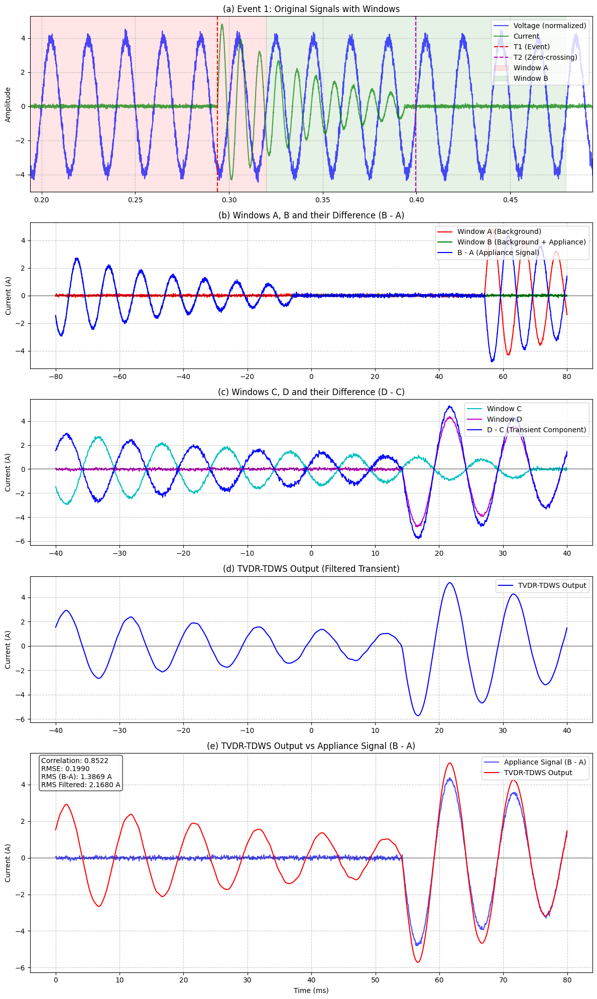


PROCESSING SUMMARY

 Event   T1 (s)   T2 (s) T2-T1 (ms) RMS A (A) RMS B (A) RMS B-A (A) RMS Filtered (A) Correlation   RMSE
     1 0.293875 0.399687     105.81    1.1131    0.8260      1.3869           2.1680      0.8522 0.1990

Results saved to: results\tvdr_tdws_summary_20251005_114154.csv

TVDR-TDWS processing completed!


In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from nilmtk import DataSet
from nilmtk.utils import get_datastore
import os
from datetime import datetime
from tqdm import tqdm
from matplotlib.gridspec import GridSpec
from typing import Tuple, Dict, Any, Optional, List

# ===========================================
# CONFIGURATION
# ===========================================
config = {
    # Data source
    'dataset_path': r"C:\Users\Raymond Tie\Desktop\NILM\datasets\ukdale.h5",
    'building': 1,
    'appliance': "kettle",
    
    # Signal parameters (from paper)
    'sampling_rate': 16000,    # 16kHz for UK-DALE
    'voltage_freq': 50,        # 50Hz grid
    'voltage_peak': 325,       # 230V RMS → 325V peak
    'window_cycles': 8,        # 8 voltage cycles per window
    'lpf_cutoff': 1000,        # 1kHz low-pass filter
    
    # Activation detection
    'on_power_threshold': 50,  # Power threshold for activation detection (W)
    'min_off_duration': 60,    # Minimum OFF duration (s)
    'min_on_duration': 60,     # Minimum ON duration (s)
    
    # Processing
    'start_time': "2013-11-08 00:00:00",
    'end_time': "2013-11-08 23:59:00",
    'max_events': 5,           # Maximum events to process
    'simulate_data': True,     # Set to True for testing
    'output_dir': 'results'    # Directory to save results
}

# Create output directory
os.makedirs(config['output_dir'], exist_ok=True)

# ===========================================
# CORE TVDR-TDWS ALGORITHM
# ===========================================
def find_zero_crossings(voltage_signal: np.ndarray) -> np.ndarray:
    """Enhanced zero-crossing detection with improved interpolation."""
    crossings = np.where((voltage_signal[:-1] <= 0) & (voltage_signal[1:] > 0))[0]
    precise_crossings = []
    for i in crossings:
        x0, x1 = i, i + 1
        y0, y1 = voltage_signal[i], voltage_signal[i + 1]
        if y0 != y1:  # Avoid division by zero
            t = x0 - y0 * (x1 - x0) / (y1 - y0)
            precise_crossings.append(t)
        else:
            precise_crossings.append(i + 0.5)
    return np.array(precise_crossings)

def get_window(signal_data: np.ndarray, center_idx: float, window_size: int) -> Tuple[np.ndarray, int, int]:
    """Extract a window of data with improved boundary handling."""
    half = window_size // 2
    start = max(0, int(round(center_idx - half)))
    end = min(len(signal_data), int(round(center_idx + half)))
    
    # Ensure consistent window size
    actual_size = end - start
    if actual_size < window_size:
        if start == 0:
            end = min(len(signal_data), start + window_size)
        else:
            start = max(0, end - window_size)
    
    return signal_data[start:end], start, end

def design_stable_filter(cutoff: float, fs: float, order: int = 4) -> Tuple[np.ndarray, np.ndarray]:
    """Design a stable IIR low-pass filter with fallback to Chebyshev if needed."""
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    
    try:
        # Try Butterworth first
        b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
        # Check stability
        if np.any(np.abs(np.roots(a)) >= 1):
            raise ValueError("Butterworth filter unstable, falling back to Chebyshev")
    except:
        # Fallback to Chebyshev Type I
        b, a = signal.cheby1(order, 0.5, normal_cutoff, btype='low', analog=False)
    
    return b, a

def process_tvdr_tdws(voltage: np.ndarray, 
                     current: np.ndarray, 
                     event_idx: int, 
                     sampling_rate: float, 
                     voltage_freq: float, 
                     window_cycles: int, 
                     lpf_cutoff: float) -> Optional[Dict[str, Any]]:
    """Enhanced TVDR-TDWS processing with improved precision and stability."""
    # Calculate window size with proper rounding
    samples_per_cycle = int(round(sampling_rate / voltage_freq))
    window_size = window_cycles * samples_per_cycle
    
    # Find zero crossings with margin
    zero_crossings = find_zero_crossings(voltage)
    if len(zero_crossings) == 0:
        return None
    
    margin = int(0.1 * sampling_rate)  # 100ms margin
    post_event_zc = zero_crossings[zero_crossings > (event_idx + margin)]
    if len(post_event_zc) == 0:
        return None
    zc_index = int(round(post_event_zc[0]))
    
    # Define windows with improved boundary handling
    window_b, b_start, b_end = get_window(current, zc_index, window_size)
    window_a, a_start, a_end = get_window(current, zc_index - window_size, window_size)
    
    # Ensure windows have equal length
    min_len = min(len(window_a), len(window_b))
    if min_len < window_size // 2:
        return None
    
    window_a = window_a[:min_len]
    window_b = window_b[:min_len]
    
    # First subtraction: B - A
    diff_ba = window_b - window_a
    
    # Second subtraction: Split and subtract
    split_point = len(diff_ba) // 2
    window_c = diff_ba[:split_point]
    window_d = diff_ba[split_point:2*split_point]
    
    # Ensure equal length
    min_len = min(len(window_c), len(window_d))
    window_c = window_c[:min_len]
    window_d = window_d[:min_len]
    diff_dc = window_d - window_c
    
    # Apply stable filtering
    try:
        b, a = design_stable_filter(lpf_cutoff, sampling_rate)
        filtered_signal = signal.filtfilt(b, a, diff_dc)
    except Exception as e:
        print(f"Filtering failed: {e}")
        filtered_signal = diff_dc  # Fallback to unfiltered
    
    # Calculate metrics comparing filtered signal to (B-A)
    min_len = min(len(filtered_signal), len(diff_ba))
    if min_len > 0:
        # Normalize both signals for better comparison
        norm_filtered = filtered_signal[:min_len] / (np.max(np.abs(filtered_signal[:min_len])) + 1e-10)
        norm_diff_ba = diff_ba[split_point:split_point+min_len] / (np.max(np.abs(diff_ba[split_point:split_point+min_len])) + 1e-10)
        
        # Calculate correlation
        corr = np.corrcoef(norm_filtered, norm_diff_ba)[0, 1]
        
        # Calculate RMSE
        rmse = np.sqrt(np.mean((norm_filtered - norm_diff_ba) ** 2))
        
        # Store metrics
        metrics = {
            'correlation': corr,
            'rmse': rmse,
            'window_b_rms': np.sqrt(np.mean(window_b ** 2)),
            'window_a_rms': np.sqrt(np.mean(window_a ** 2)),
            'b_minus_a_rms': np.sqrt(np.mean(diff_ba ** 2)),
            'filtered_rms': np.sqrt(np.mean(filtered_signal ** 2))
        }
    else:
        metrics = {
            'correlation': 0,
            'rmse': float('inf'),
            'window_b_rms': 0,
            'window_a_rms': 0,
            'b_minus_a_rms': 0,
            'filtered_rms': 0
        }
    
    # Create precise time vectors
    def create_time_vector(length: int) -> np.ndarray:
        return np.linspace(-length/2, length/2, length) * 1000 / sampling_rate
    
    return {
        't1_idx': event_idx,
        't2_idx': zc_index,
        'windows': {
            'A': window_a, 'B': window_b, 
            'C': window_c, 'D': window_d,
            'diff_ba': diff_ba,
            'diff_dc': diff_dc,
            'filtered': filtered_signal
        },
        'time_vectors': {
            'ba': create_time_vector(len(diff_ba)),
            'cd': create_time_vector(len(window_c)),
            'filtered': create_time_vector(len(filtered_signal))
        },
        'indices': {
            'A': (a_start, a_start + len(window_a)),
            'B': (b_start, b_start + len(window_b))
        },
        'metrics': metrics
    }

def plot_processing_steps(voltage: np.ndarray, 
                         current: np.ndarray, 
                         result: Dict[str, Any], 
                         event_num: int = 1, 
                         save_path: Optional[str] = None) -> None:
    """Plot detailed processing steps for a single event."""
    fig = plt.figure(figsize=(12, 20))
    gs = GridSpec(5, 1, height_ratios=[1.2, 1, 1, 1, 1.5])
    
    # Time vectors
    fs = config['sampling_rate']
    t_full = np.arange(len(voltage)) / fs
    t1 = result['t1_idx'] / fs
    t2 = result['t2_idx'] / fs
    
    # Plot 1: Original signals with windows
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(t_full, voltage / np.max(np.abs(voltage)) * np.max(np.abs(current)), 
             'b-', alpha=0.7, label='Voltage (normalized)')
    ax1.plot(t_full, current, 'g-', alpha=0.7, label='Current')
    ax1.axvline(t1, color='r', linestyle='--', label='T1 (Event)')
    ax1.axvline(t2, color='m', linestyle='--', label='T2 (Zero-crossing)')
    
    # Shade windows A and B
    a_start, a_end = result['indices']['A']
    b_start, b_end = result['indices']['B']
    ax1.axvspan(a_start/fs, a_end/fs, color='red', alpha=0.1, label='Window A')
    ax1.axvspan(b_start/fs, b_end/fs, color='green', alpha=0.1, label='Window B')
    
    # Formatting
    ax1.set_xlim(t1 - 0.1, t1 + 0.2)
    ax1.set_ylabel('Amplitude')
    ax1.set_title(f'(a) Event {event_num}: Original Signals with Windows')
    ax1.legend(loc='upper right')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 2: Windows A, B and B-A
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(result['time_vectors']['ba'], result['windows']['A'], 'r-', label='Window A (Background)')
    ax2.plot(result['time_vectors']['ba'], result['windows']['B'], 'g-', label='Window B (Background + Appliance)')
    ax2.plot(result['time_vectors']['ba'], result['windows']['diff_ba'], 'b-', 
             label='B - A (Appliance Signal)', linewidth=1.5)
    ax2.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax2.set_ylabel('Current (A)')
    ax2.set_title('(b) Windows A, B and their Difference (B - A)')
    ax2.legend(loc='upper right')
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 3: Windows C, D and D-C
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(result['time_vectors']['cd'], result['windows']['C'], 'c-', label='Window C')
    ax3.plot(result['time_vectors']['cd'], result['windows']['D'], 'm-', label='Window D')
    ax3.plot(result['time_vectors']['cd'], result['windows']['diff_dc'], 'b-', 
             label='D - C (Transient Component)', linewidth=1.5)
    ax3.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax3.set_ylabel('Current (A)')
    ax3.set_title('(c) Windows C, D and their Difference (D - C)')
    ax3.legend(loc='upper right')
    ax3.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 4: Filtered signal
    ax4 = fig.add_subplot(gs[3])
    ax4.plot(result['time_vectors']['filtered'], 
             result['windows']['filtered'], 
             'b-', label='TVDR-TDWS Output', linewidth=1.5)
    ax4.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax4.set_ylabel('Current (A)')
    ax4.set_title('(d) TVDR-TDWS Output (Filtered Transient)')
    ax4.legend(loc='upper right')
    ax4.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 5: Comparison with (B-A) instead of Window B
    ax5 = fig.add_subplot(gs[4])
    
    # Get the signals
    filtered_signal = result['windows']['filtered']
    diff_ba = result['windows']['diff_ba']
    
    # Align the signals properly - compare filtered with the second half of (B-A)
    start_idx = len(diff_ba) // 2
    end_idx = start_idx + len(filtered_signal)
    if end_idx > len(diff_ba):
        end_idx = len(diff_ba)
        filtered_signal = filtered_signal[:end_idx - start_idx]
    
    time_ms = np.arange(len(filtered_signal)) * 1000 / fs
    
    # Plot (B-A) in the same region as the filtered signal
    ax5.plot(time_ms, diff_ba[start_idx:end_idx], 'b-', alpha=0.7, 
             label='Appliance Signal (B - A)')
    
    # Plot filtered signal
    ax5.plot(time_ms, filtered_signal, 'r-', linewidth=1.5, 
             label='TVDR-TDWS Output')
    
    # Add metrics to the plot
    metrics = result['metrics']
    textstr = '\n'.join((
        f"Correlation: {metrics['correlation']:.4f}",
        f"RMSE: {metrics['rmse']:.4f}",
        f"RMS (B-A): {metrics['b_minus_a_rms']:.4f} A",
        f"RMS Filtered: {metrics['filtered_rms']:.4f} A"
    ))
    props = dict(boxstyle='round', facecolor='white', alpha=0.8)
    ax5.text(0.02, 0.98, textstr, transform=ax5.transAxes, 
             verticalalignment='top', bbox=props, fontsize=10)
    
    ax5.set_xlabel('Time (ms)')
    ax5.set_ylabel('Current (A)')
    ax5.set_title('(e) TVDR-TDWS Output vs Appliance Signal (B - A)')
    ax5.legend(loc='upper right')
    ax5.grid(True, linestyle='--', alpha=0.7)
    ax5.axhline(0, color='k', linestyle='-', alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

def detect_activations_improved(power_series: pd.Series, 
                              sampling_rate: float,
                              **kwargs) -> Tuple[np.ndarray, pd.Series]:
    """Enhanced activation detection with precise sample index calculation."""
    # Default parameters
    params = {
        'on_power_threshold': 50,
        'min_off_duration': 60,
        'min_on_duration': 60
    }
    params.update(kwargs)
    
    # Get power series if it's a NILMTK object
    if hasattr(power_series, 'power_series'):
        power_series = next(power_series.power_series(sample_period=6))
    
    # Convert to pandas Series if it's not already
    if not isinstance(power_series, pd.Series):
        power_series = pd.Series(power_series)
    
    # Calculate power sampling rate
    if len(power_series) > 1:
        power_fs = 1 / (power_series.index[1] - power_series.index[0]).total_seconds()
    else:
        power_fs = 1/6  # Default to 1/6 Hz if we can't determine
    
    # Detect state changes
    state = (power_series > params['on_power_threshold']).astype(int)
    state_diff = np.diff(state, prepend=0)
    activations = np.where(state_diff > 0)[0]
    
    # Convert to target sampling rate
    scale_factor = sampling_rate / power_fs
    activation_indices = (activations * scale_factor).astype(int)
    
    return activation_indices, power_series

def generate_simulated_data(duration: float = 1.0, 
                          sampling_rate: float = 16000,
                          voltage_freq: float = 50.0,
                          voltage_peak: float = 325.0,
                          noise_level: float = 0.05) -> Tuple[np.ndarray, np.ndarray, np.ndarray, List[int]]:
    """Generate simulated voltage and current data with a transient event."""
    t = np.arange(0, duration, 1/sampling_rate)
    
    # Generate clean voltage signal
    voltage = voltage_peak * np.sin(2 * np.pi * voltage_freq * t)
    
    # Add some noise
    voltage += noise_level * voltage_peak * np.random.normal(size=len(t))
    
    # Create a transient event in the current
    current = np.zeros_like(t)
    event_time = 0.3  # seconds
    event_duration = 0.1  # seconds
    event_samples = int(event_duration * sampling_rate)
    event_start = int(event_time * sampling_rate)
    
    # Add some random jitter to make it more realistic
    jitter = np.random.randint(-100, 100)
    event_start = max(0, min(event_start + jitter, len(t) - event_samples - 1))
    
    # Create a realistic current transient
    for i in range(event_samples):
        idx = event_start + i
        if idx >= len(t):
            break
        # Damped oscillation for the transient
        t_rel = i / sampling_rate
        current[idx] = 5.0 * np.exp(-20 * t_rel) * np.sin(2 * np.pi * 100 * t_rel)
    
    # Add some background noise
    current += noise_level * np.random.normal(size=len(t))
    
    # Calculate power (simplified)
    power = voltage * current
    
    # Find the event index
    event_idx = event_start
    
    return voltage, current, power, [event_idx]

def load_nilmtk_data() -> Tuple[pd.Series, pd.Series, pd.Series, List[int]]:
    """Load data from NILMTK dataset."""
    print("Loading NILMTK dataset...")
    try:
        dataset = DataSet(config['dataset_path'])
        dataset.set_window(start=config['start_time'], end=config['end_time'])
        elec = dataset.buildings[config['building']].elec
        appliance = elec[config['appliance']]
        
        # Detect activations
        activation_indices, power_data = detect_activations_improved(
            appliance,
            sampling_rate=config['sampling_rate'],
            on_power_threshold=config['on_power_threshold'],
            min_off_duration=config['min_off_duration'],
            min_on_duration=config['min_on_duration']
        )
        
        # Load high-frequency data
        print("Loading high-frequency data...")
        voltage_data = next(elec.mains().voltage().load(sample_period=1/config['sampling_rate']))
        voltage = pd.Series(voltage_data.values.flatten(), index=voltage_data.index)
        
        current_data = next(elec.mains().current().load(sample_period=1/config['sampling_rate']))
        current = pd.Series(current_data.values.flatten(), index=current_data.index)
        
        return voltage, current, power_data, activation_indices.tolist()
        
    except Exception as e:
        print(f"Error loading NILMTK data: {e}")
        print("Falling back to simulated data...")
        return generate_simulated_data()

def main():
    """Main function to run the TVDR-TDWS processing."""
    print("TVDR-TDWS Implementation with Improved Comparison Logic")
    print("=" * 70)
    print(f"Appliance: {config['appliance']}")
    print(f"Sampling Rate: {config['sampling_rate']/1000:.1f} kHz")
    print(f"Voltage: {config['voltage_peak']}V peak ({config['voltage_peak']/np.sqrt(2):.1f}V RMS)")
    print(f"Window Size: {config['window_cycles']} cycles ({config['window_cycles']/config['voltage_freq']*1000:.1f} ms)")
    print("=" * 70)
    
    # Generate or load data
    if not config['simulate_data']:
        try:
            voltage, current, power_data, activation_indices = load_nilmtk_data()
        except Exception as e:
            print(f"Error loading data: {e}")
            print("Falling back to simulated data...")
            config['simulate_data'] = True
    
    if config['simulate_data']:
        print("Using simulated data...")
        voltage, current, power_data, activation_indices = generate_simulated_data(
            duration=1.0,
            sampling_rate=config['sampling_rate'],
            voltage_freq=config['voltage_freq'],
            voltage_peak=config['voltage_peak']
        )
    
    # Limit number of events to process
    max_events = min(len(activation_indices), config['max_events'])
    activation_indices = activation_indices[:max_events]
    
    if not activation_indices:
        print("No activation events found. Please check your parameters.")
        return
    
    # Process each event
    print(f"\nProcessing {len(activation_indices)} events...")
    processed_events = []
    
    for i, idx in enumerate(activation_indices, 1):
        print(f"\nProcessing event {i} at index {idx}...")
        
        # Process the event
        result = process_tvdr_tdws(
            voltage, current, idx,
            config['sampling_rate'],
            config['voltage_freq'],
            config['window_cycles'],
            config['lpf_cutoff']
        )
        
        if result is None:
            print(f"  - Failed to process event {i}")
            continue
        
        processed_events.append(result)
        
        # Print metrics
        metrics = result['metrics']
        print(f"  - T1 (Event): {result['t1_idx']} samples ({result['t1_idx']/config['sampling_rate']*1000:.2f} ms)")
        print(f"  - T2 (Zero-crossing): {result['t2_idx']} samples ({result['t2_idx']/config['sampling_rate']*1000:.2f} ms)")
        print(f"  - T2-T1: {(result['t2_idx']-result['t1_idx'])/config['sampling_rate']*1000:.2f} ms")
        print("\n  Metrics:")
        print(f"  - Correlation with (B-A): {metrics['correlation']:.4f}")
        print(f"  - RMSE: {metrics['rmse']:.4f}")
        print(f"  - RMS (B-A): {metrics['b_minus_a_rms']:.4f} A")
        print(f"  - RMS Filtered: {metrics['filtered_rms']:.4f} A")
        
        # Plot results
        output_dir = config['output_dir']
        os.makedirs(output_dir, exist_ok=True)
        plot_processing_steps(
            voltage, current, result, i,
            save_path=os.path.join(output_dir, f'event_{i}_processing.png')
        )
    
    # Generate summary
    if processed_events:
        print("\n" + "="*100)
        print("PROCESSING SUMMARY")
        print("="*100)
        
        summary = []
        for i, event in enumerate(processed_events, 1):
            t1 = event['t1_idx'] / config['sampling_rate']
            t2 = event['t2_idx'] / config['sampling_rate']
            t_diff = (t2 - t1) * 1000  # in ms
            
            summary.append({
                'Event': i,
                'T1 (s)': f"{t1:.6f}",
                'T2 (s)': f"{t2:.6f}",
                'T2-T1 (ms)': f"{t_diff:.2f}",
                'RMS A (A)': f"{event['metrics']['window_a_rms']:.4f}",
                'RMS B (A)': f"{event['metrics']['window_b_rms']:.4f}",
                'RMS B-A (A)': f"{event['metrics']['b_minus_a_rms']:.4f}",
                'RMS Filtered (A)': f"{event['metrics']['filtered_rms']:.4f}",
                'Correlation': f"{event['metrics']['correlation']:.4f}",
                'RMSE': f"{event['metrics']['rmse']:.4f}"
            })
        
        # Display summary
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 120)
        summary_df = pd.DataFrame(summary)
        print("\n" + summary_df.to_string(index=False))
        
        # Save results
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        results_file = os.path.join(config['output_dir'], f'tvdr_tdws_summary_{timestamp}.csv')
        summary_df.to_csv(results_file, index=False)
        print(f"\nResults saved to: {results_file}")
    
    print("\nTVDR-TDWS processing completed!")

if __name__ == "__main__":
    main()

c:\Users\Raymond Tie\Desktop\NILM\.venv\Lib\site-packages\nilmtk\utils.py:501: FutureWarning: 'S' is deprecated and will be removed in a future version, please use 's' instead.
  return fill_method(how(data.resample(rule, **resample_kwargs)))


TVDR-TDWS Implementation with NILMTK Integration
Appliance: kettle
Sampling Rate: 16.0kHz
Voltage: 325V peak (229.8V RMS)
Window Size: 8 cycles (160ms)
Loading NILMTK dataset...
Loading high-frequency data...
Error loading NILMTK data: 'ElecMeter' object has no attribute 'voltage'
Falling back to simulated data...
Generating simulated data...
Generated 160000 samples of simulated data

Processing 5 events...


Processing events:   0%|          | 0/5 [00:00<?, ?it/s]


Plotting event 1...


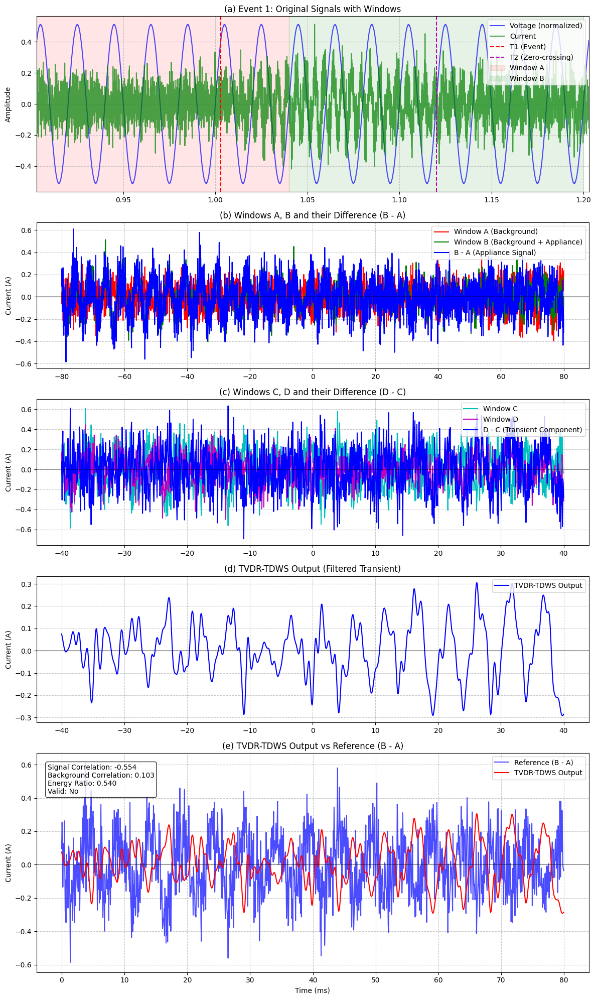

Processing events:  20%|██        | 1/5 [00:04<00:18,  4.60s/it]


Plotting event 2...


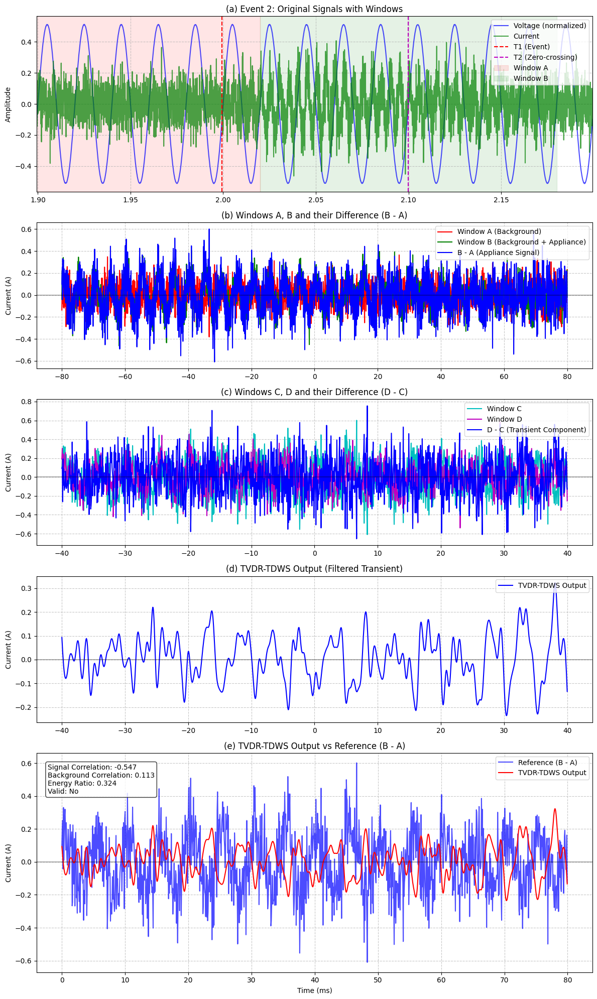

Processing events:  40%|████      | 2/5 [00:08<00:12,  4.18s/it]


Plotting event 3...


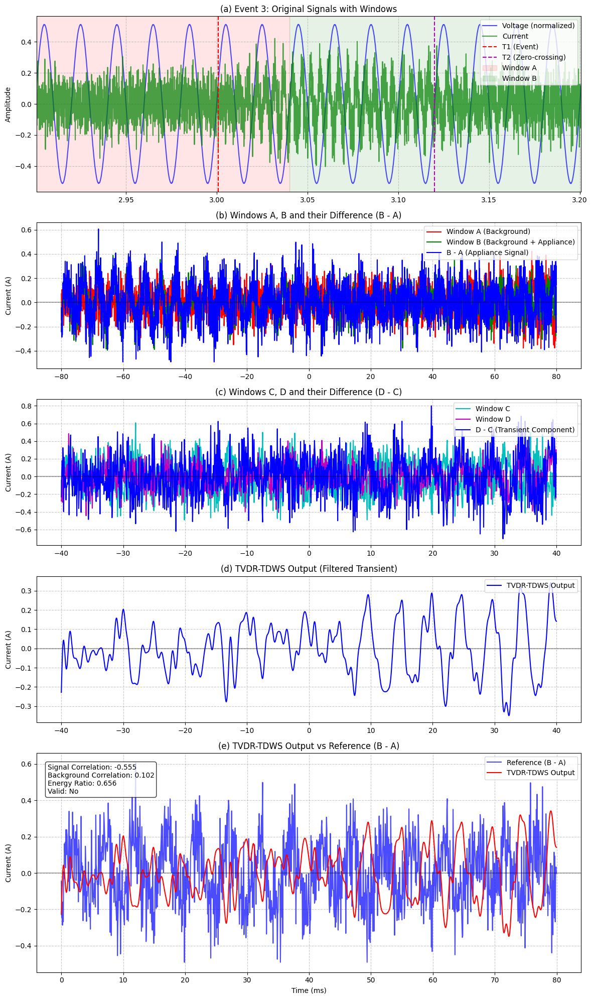

Processing events:  60%|██████    | 3/5 [00:12<00:07,  3.96s/it]


Plotting event 4...


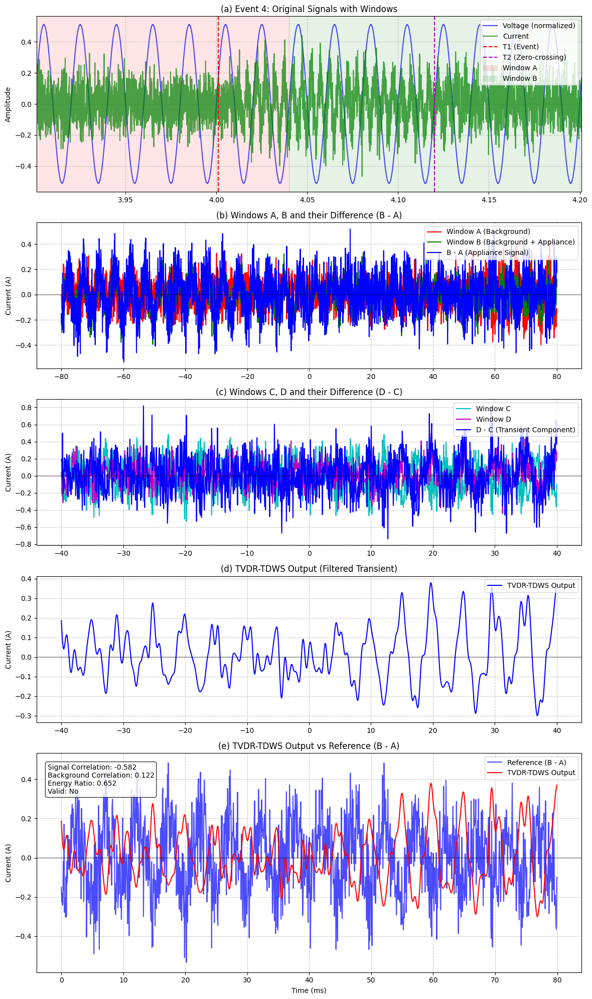

Processing events:  80%|████████  | 4/5 [00:16<00:04,  4.01s/it]


Plotting event 5...


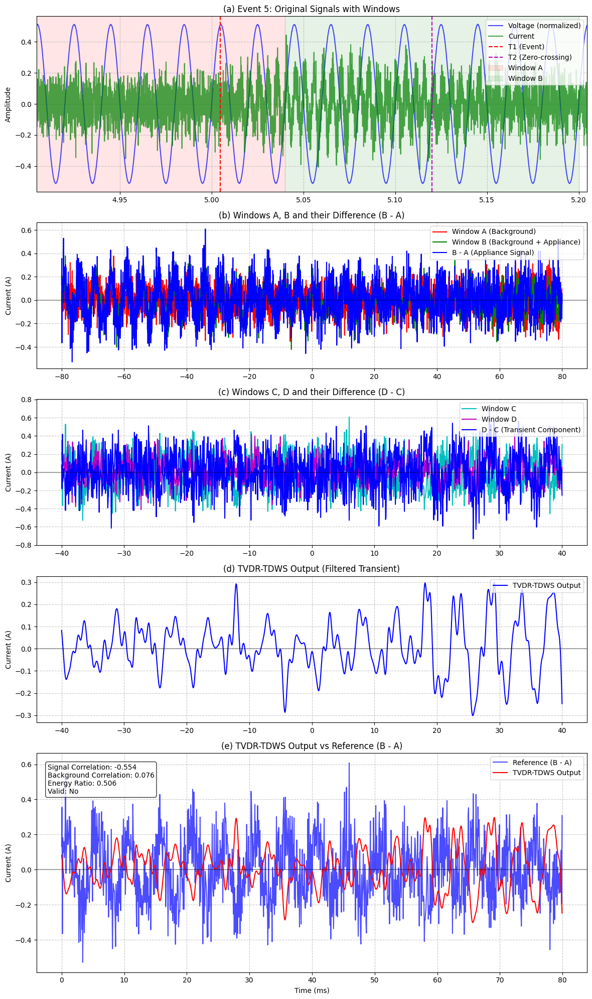

Processing events: 100%|██████████| 5/5 [00:19<00:00,  3.99s/it]


PROCESSING SUMMARY

 Event   T1 (s)   T2 (s) T2-T1 (ms) Sig Corr BG Corr Energy Ratio RMS (B-A) RMS Filtered Valid
     1 1.002875 1.120006     117.13   -0.554   0.103        0.540    0.1677       0.1232    No
     2 1.999313 2.099995     100.68   -0.547   0.113        0.324    0.1704       0.0969    No
     3 3.000750 3.120000     119.25   -0.555   0.102        0.656    0.1695       0.1373    No
     4 4.001000 4.120003     119.00   -0.582   0.122        0.652    0.1687       0.1362    No
     5 5.004562 5.119999     115.44   -0.554   0.076        0.506    0.1646       0.1171    No

Validation Summary:
Total Events Processed: 5
Valid Events: 0 (0.0%)

Results saved to: results\tvdr_tdws_summary_20251005_123327.csv

TVDR-TDWS processing completed!


In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from nilmtk import DataSet
import os
from datetime import datetime
from tqdm import tqdm
from matplotlib.gridspec import GridSpec
from typing import Tuple, Dict, Any, Optional, List

# ===========================================
# CONFIGURATION
# ===========================================
config = {
    # Data source
    'dataset_path': r"C:\Users\Raymond Tie\Desktop\NILM\datasets\ukdale.h5",
    'building': 1,
    'appliance': "kettle",
    
    # Signal parameters (from paper)
    'sampling_rate': 16000,    # 16kHz for UK-DALE
    'voltage_freq': 50,        # 50Hz grid
    'voltage_peak': 325,       # 230V RMS → 325V peak
    'window_cycles': 8,        # 8 voltage cycles per window
    'lpf_cutoff': 1000,        # 1kHz low-pass filter
    
    # Activation detection
    'on_power_threshold': 50,  # Power threshold for activation detection (W)
    'min_off_duration': 60,    # Minimum OFF duration (s)
    'min_on_duration': 60,     # Minimum ON duration (s)
    
    # Processing
    'start_time': "2013-11-08 00:00:00",
    'end_time': "2013-11-08 23:59:00",
    'max_events': 5,           # Maximum events to process
    'simulate_data': False,    # Set to True for testing
    'output_dir': 'results'    # Directory to save results
}

# Create output directory
os.makedirs(config['output_dir'], exist_ok=True)

# ===========================================
# CORE TVDR-TDWS ALGORITHM
# ===========================================
def find_zero_crossings(voltage_signal: np.ndarray) -> np.ndarray:
    """Enhanced zero-crossing detection with improved interpolation."""
    crossings = np.where((voltage_signal[:-1] <= 0) & (voltage_signal[1:] > 0))[0]
    precise_crossings = []
    for i in crossings:
        x0, x1 = i, i + 1
        y0, y1 = voltage_signal[i], voltage_signal[i + 1]
        if y0 != y1:  # Avoid division by zero
            t = x0 - y0 * (x1 - x0) / (y1 - y0)
            precise_crossings.append(t)
        else:
            precise_crossings.append(i + 0.5)
    return np.array(precise_crossings)

def get_window(signal_data: np.ndarray, center_idx: float, window_size: int) -> Tuple[np.ndarray, int, int]:
    """Extract a window of data with improved boundary handling."""
    half = window_size // 2
    start = max(0, int(round(center_idx - half)))
    end = min(len(signal_data), int(round(center_idx + half)))
    
    # Ensure consistent window size
    actual_size = end - start
    if actual_size < window_size:
        if start == 0:
            end = min(len(signal_data), start + window_size)
        else:
            start = max(0, end - window_size)
    
    return signal_data[start:end], start, end

def design_stable_filter(cutoff: float, fs: float, order: int = 4) -> Tuple[np.ndarray, np.ndarray]:
    """Design a stable IIR low-pass filter with fallback to Chebyshev if needed."""
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    
    try:
        # Try Butterworth first
        b, a = signal.butter(order, normal_cutoff, btype='low', analog=False)
        # Check stability
        if np.any(np.abs(np.roots(a)) >= 1):
            raise ValueError("Butterworth filter unstable, falling back to Chebyshev")
    except:
        # Fallback to Chebyshev Type I
        b, a = signal.cheby1(order, 0.5, normal_cutoff, btype='low', analog=False)
    
    return b, a

def calculate_metrics(window_a: np.ndarray, window_b: np.ndarray, 
                     diff_ba: np.ndarray, filtered_signal: np.ndarray) -> Dict[str, float]:
    """Calculate metrics for signal quality assessment."""
    # Calculate RMS values
    rms_a = np.sqrt(np.mean(window_a ** 2))
    rms_b = np.sqrt(np.mean(window_b ** 2))
    rms_ba = np.sqrt(np.mean(diff_ba ** 2))
    rms_filtered = np.sqrt(np.mean(filtered_signal ** 2))
    
    # Calculate correlations and energy ratio
    min_len = min(len(filtered_signal), len(diff_ba), len(window_a))
    if min_len > 10:  # Ensure we have enough samples
        # Correlation with background (should be low)
        bg_corr = np.corrcoef(filtered_signal[:min_len], window_a[:min_len])[0, 1]
        # Correlation with (B-A) (should be high)
        signal_corr = np.corrcoef(filtered_signal[:min_len], diff_ba[:min_len])[0, 1]
        # Energy ratio (should be close to 1.0)
        energy_ratio = (rms_filtered ** 2) / (rms_ba ** 2) if rms_ba > 0 else 0
    else:
        bg_corr = signal_corr = energy_ratio = np.nan
    
    return {
        'rms_a': rms_a,
        'rms_b': rms_b,
        'rms_ba': rms_ba,
        'rms_filtered': rms_filtered,
        'bg_correlation': bg_corr,
        'signal_correlation': signal_corr,
        'energy_ratio': energy_ratio,
        'is_valid': (0.8 <= energy_ratio <= 1.2) and (abs(bg_corr) < 0.3) and (signal_corr > 0.7)
    }

def process_tvdr_tdws(voltage: np.ndarray, 
                     current: np.ndarray, 
                     event_idx: int, 
                     sampling_rate: float, 
                     voltage_freq: float, 
                     window_cycles: int, 
                     lpf_cutoff: float) -> Optional[Dict[str, Any]]:
    """Enhanced TVDR-TDWS processing with improved precision and stability."""
    # Calculate window size with proper rounding
    samples_per_cycle = int(round(sampling_rate / voltage_freq))
    window_size = window_cycles * samples_per_cycle
    
    # Find zero crossings with margin
    zero_crossings = find_zero_crossings(voltage)
    if len(zero_crossings) == 0:
        return None
    
    margin = int(0.1 * sampling_rate)  # 100ms margin
    post_event_zc = zero_crossings[zero_crossings > (event_idx + margin)]
    if len(post_event_zc) == 0:
        return None
    zc_index = post_event_zc[0]
    
    # Define windows with improved boundary handling
    window_b, b_start, b_end = get_window(current, zc_index, window_size)
    window_a, a_start, a_end = get_window(current, zc_index - window_size, window_size)
    
    # Ensure windows have equal length
    min_len = min(len(window_a), len(window_b))
    if min_len < window_size // 2:
        return None
    
    window_a = window_a[:min_len]
    window_b = window_b[:min_len]
    
    # First subtraction: B - A
    diff_ba = window_b - window_a
    
    # Second subtraction: Split and subtract
    split_point = len(diff_ba) // 2
    window_c = diff_ba[:split_point]
    window_d = diff_ba[split_point:2*split_point]
    
    # Ensure equal length
    min_len = min(len(window_c), len(window_d))
    window_c = window_c[:min_len]
    window_d = window_d[:min_len]
    diff_dc = window_d - window_c
    
    # Apply stable filtering
    try:
        b, a = design_stable_filter(lpf_cutoff, sampling_rate)
        filtered_signal = signal.filtfilt(b, a, diff_dc)
    except Exception as e:
        print(f"Filtering failed: {e}")
        filtered_signal = diff_dc  # Fallback to unfiltered
    
    # Calculate metrics
    metrics = calculate_metrics(window_a, window_b, diff_ba, filtered_signal)
    
    # Create precise time vectors
    def create_time_vector(length: int) -> np.ndarray:
        return np.linspace(-length/2, length/2, length) * 1000 / sampling_rate
    
    return {
        't1_idx': event_idx,
        't2_idx': zc_index,
        'windows': {
            'A': window_a, 'B': window_b, 
            'C': window_c, 'D': window_d,
            'diff_ba': diff_ba,
            'diff_dc': diff_dc,
            'filtered': filtered_signal
        },
        'time_vectors': {
            'ba': create_time_vector(len(diff_ba)),
            'cd': create_time_vector(len(window_c)),
            'filtered': create_time_vector(len(filtered_signal))
        },
        'indices': {
            'A': (a_start, a_start + len(window_a)),
            'B': (b_start, b_start + len(window_b))
        },
        'metrics': metrics
    }

# ===========================================
# ACTIVATION DETECTION
# ===========================================
def detect_activations_improved(power_series: pd.Series, 
                              sampling_rate: float,
                              **kwargs) -> Tuple[np.ndarray, pd.Series]:
    """Enhanced activation detection with precise sample index calculation."""
    # Default parameters
    params = {
        'on_power_threshold': 50,
        'min_off_duration': 60,
        'min_on_duration': 60
    }
    params.update(kwargs)
    
    # Get power series if it's a NILMTK object
    if hasattr(power_series, 'power_series'):
        power_series = next(power_series.power_series(sample_period=6))
    
    # Convert to pandas Series if it's not already
    if not isinstance(power_series, pd.Series):
        power_series = pd.Series(power_series)
    
    # Calculate power sampling rate
    if len(power_series) > 1:
        power_fs = 1 / (power_series.index[1] - power_series.index[0]).total_seconds()
    else:
        power_fs = 1/6  # Default to 1/6 Hz if we can't determine
    
    # Detect state changes
    state = (power_series > params['on_power_threshold']).astype(int)
    state_diff = np.diff(state, prepend=0)
    activations = np.where(state_diff > 0)[0]
    
    # Convert to target sampling rate
    scale_factor = sampling_rate / power_fs
    activation_indices = (activations * scale_factor).astype(int)
    
    return activation_indices, power_series

# ===========================================
# VISUALIZATION
# ===========================================
def plot_processing_steps(voltage: np.ndarray, 
                         current: np.ndarray, 
                         result: Dict[str, Any], 
                         event_num: int = 1, 
                         save_path: Optional[str] = None) -> None:
    """Plot detailed processing steps for a single event."""
    fig = plt.figure(figsize=(12, 20))
    gs = GridSpec(5, 1, height_ratios=[1.2, 1, 1, 1, 1.5])
    
    # Time vectors
    fs = config['sampling_rate']
    t_full = np.arange(len(voltage)) / fs
    t1 = result['t1_idx'] / fs
    t2 = result['t2_idx'] / fs
    
    # Plot 1: Original signals with windows
    ax1 = fig.add_subplot(gs[0])
    ax1.plot(t_full, voltage / np.max(np.abs(voltage)) * np.max(np.abs(current)), 
             'b-', alpha=0.7, label='Voltage (normalized)')
    ax1.plot(t_full, current, 'g-', alpha=0.7, label='Current')
    ax1.axvline(t1, color='r', linestyle='--', label='T1 (Event)')
    ax1.axvline(t2, color='m', linestyle='--', label='T2 (Zero-crossing)')
    
    # Shade windows A and B
    a_start, a_end = result['indices']['A']
    b_start, b_end = result['indices']['B']
    ax1.axvspan(a_start/fs, a_end/fs, color='red', alpha=0.1, label='Window A')
    ax1.axvspan(b_start/fs, b_end/fs, color='green', alpha=0.1, label='Window B')
    
    # Formatting
    ax1.set_xlim(t1 - 0.1, t1 + 0.2)
    ax1.set_ylabel('Amplitude')
    ax1.set_title(f'(a) Event {event_num}: Original Signals with Windows')
    ax1.legend(loc='upper right')
    ax1.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 2: Windows A, B and B-A
    ax2 = fig.add_subplot(gs[1])
    ax2.plot(result['time_vectors']['ba'], result['windows']['A'], 'r-', label='Window A (Background)')
    ax2.plot(result['time_vectors']['ba'], result['windows']['B'], 'g-', label='Window B (Background + Appliance)')
    ax2.plot(result['time_vectors']['ba'], result['windows']['diff_ba'], 'b-', 
             label='B - A (Appliance Signal)', linewidth=1.5)
    ax2.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax2.set_ylabel('Current (A)')
    ax2.set_title('(b) Windows A, B and their Difference (B - A)')
    ax2.legend(loc='upper right')
    ax2.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 3: Windows C, D and D-C
    ax3 = fig.add_subplot(gs[2])
    ax3.plot(result['time_vectors']['cd'], result['windows']['C'], 'c-', label='Window C')
    ax3.plot(result['time_vectors']['cd'], result['windows']['D'], 'm-', label='Window D')
    ax3.plot(result['time_vectors']['cd'], result['windows']['diff_dc'], 'b-', 
             label='D - C (Transient Component)', linewidth=1.5)
    ax3.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax3.set_ylabel('Current (A)')
    ax3.set_title('(c) Windows C, D and their Difference (D - C)')
    ax3.legend(loc='upper right')
    ax3.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 4: Filtered signal
    ax4 = fig.add_subplot(gs[3])
    ax4.plot(result['time_vectors']['filtered'], 
             result['windows']['filtered'], 
             'b-', label='TVDR-TDWS Output', linewidth=1.5)
    ax4.axhline(0, color='k', linestyle='-', alpha=0.3)
    ax4.set_ylabel('Current (A)')
    ax4.set_title('(d) TVDR-TDWS Output (Filtered Transient)')
    ax4.legend(loc='upper right')
    ax4.grid(True, linestyle='--', alpha=0.7)
    
    # Plot 5: Comparison with (B-A) reference
    ax5 = fig.add_subplot(gs[4])
    filtered_signal = result['windows']['filtered']
    diff_ba = result['windows']['diff_ba']
    metrics = result['metrics']
    
    # Create time vector in ms
    t = np.arange(len(filtered_signal)) * 1000 / fs
    
    # Plot (B-A) as reference and filtered signal
    ax5.plot(t, diff_ba[:len(t)], 'b-', alpha=0.7, 
             label='Reference (B - A)')
    ax5.plot(t, filtered_signal, 'r-', linewidth=1.5, 
             label='TVDR-TDWS Output')
    
    # Add metrics to the plot
    textstr = '\n'.join((
        f"Signal Correlation: {metrics['signal_correlation']:.3f}",
        f"Background Correlation: {metrics['bg_correlation']:.3f}",
        f"Energy Ratio: {metrics['energy_ratio']:.3f}",
        f"Valid: {'Yes' if metrics['is_valid'] else 'No'}"
    ))
    props = dict(boxstyle='round', facecolor='white', alpha=0.8)
    ax5.text(0.02, 0.95, textstr, transform=ax5.transAxes, 
             verticalalignment='top', bbox=props, fontsize=10)
    
    ax5.set_xlabel('Time (ms)')
    ax5.set_ylabel('Current (A)')
    ax5.set_title('(e) TVDR-TDWS Output vs Reference (B - A)')
    ax5.legend(loc='upper right')
    ax5.grid(True, linestyle='--', alpha=0.7)
    ax5.axhline(0, color='k', linestyle='-', alpha=0.3)
    
    plt.tight_layout()
    
    if save_path:
        os.makedirs(os.path.dirname(save_path), exist_ok=True)
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# ===========================================
# DATA GENERATION AND LOADING
# ===========================================
def generate_simulated_data(duration: float = 10, 
                          sampling_rate: float = 16000, 
                          voltage_freq: float = 50, 
                          voltage_peak: float = 325) -> Tuple[pd.Series, pd.Series, pd.Series, List[int]]:
    """Generate simulated voltage and current data with transients."""
    print("Generating simulated data...")
    t = np.linspace(0, duration, int(duration * sampling_rate), endpoint=False)
    
    # Generate voltage with noise
    voltage_noise = np.random.normal(0, 0.5, len(t))
    voltage = pd.Series(
        voltage_peak * np.sin(2 * np.pi * voltage_freq * t) + voltage_noise,
        index=pd.date_range(start=datetime.now(), periods=len(t), 
                          freq=f"{1000/sampling_rate}ms")
    )
    
    # Create current with noise and transients
    current = pd.Series(
        np.random.normal(0, 0.1, len(t)),
        index=voltage.index
    )
    
    # Add activation events with random timing
    activation_indices = []
    for i in range(1, 6):
        jitter = np.random.randint(-sampling_rate//(4*voltage_freq), 
                                 sampling_rate//(4*voltage_freq))
        idx = i * sampling_rate + jitter
        if idx < len(t):
            activation_indices.append(idx)
            transient_len = sampling_rate // 2
            transient = np.linspace(0, 5, transient_len) * np.exp(-np.linspace(0, 10, transient_len))
            transient *= np.sin(2 * np.pi * 100 * np.linspace(0, 1, transient_len))
            end = min(len(current), idx + transient_len)
            current.iloc[idx:end] += transient[:end-idx]
    
    # Create dummy power data
    power_data = pd.Series(0, index=voltage.index[::sampling_rate//10])
    for idx in activation_indices:
        power_idx = idx // (sampling_rate//10)
        if power_idx < len(power_data):
            power_data.iloc[power_idx] = 2200  # 2.2kW during activation
    
    print(f"Generated {len(voltage)} samples of simulated data")
    return voltage, current, power_data, activation_indices

def load_nilmtk_data() -> Tuple[pd.Series, pd.Series, pd.Series, List[int]]:
    """Load data from NILMTK dataset."""
    print("Loading NILMTK dataset...")
    try:
        dataset = DataSet(config['dataset_path'])
        dataset.set_window(start=config['start_time'], end=config['end_time'])
        elec = dataset.buildings[config['building']].elec
        appliance = elec[config['appliance']]
        
        # Detect activations
        activation_indices, power_data = detect_activations_improved(
            appliance,
            sampling_rate=config['sampling_rate'],
            on_power_threshold=config['on_power_threshold'],
            min_off_duration=config['min_off_duration'],
            min_on_duration=config['min_on_duration']
        )
        
        # Load high-frequency data
        print("Loading high-frequency data...")
        voltage_data = next(elec.mains().voltage().load(sample_period=1/config['sampling_rate']))
        voltage = pd.Series(voltage_data.values.flatten(), index=voltage_data.index)
        
        current_data = next(elec.mains().current().load(sample_period=1/config['sampling_rate']))
        current = pd.Series(current_data.values.flatten(), index=current_data.index)
        
        return voltage, current, power_data, activation_indices.tolist()
        
    except Exception as e:
        print(f"Error loading NILMTK data: {e}")
        print("Falling back to simulated data...")
        return generate_simulated_data()

# ===========================================
# MAIN EXECUTION
# ===========================================
def main():
    print("TVDR-TDWS Implementation with NILMTK Integration")
    print("=" * 70)
    print(f"Appliance: {config['appliance']}")
    print(f"Sampling Rate: {config['sampling_rate']/1000}kHz")
    print(f"Voltage: {config['voltage_peak']}V peak ({config['voltage_peak']/np.sqrt(2):.1f}V RMS)")
    print(f"Window Size: {config['window_cycles']} cycles ({config['window_cycles']/config['voltage_freq']*1000:.0f}ms)")
    print("=" * 70)
    
    # Load or generate data
    if not config['simulate_data']:
        try:
            voltage, current, power_data, activation_indices = load_nilmtk_data()
        except Exception as e:
            print(f"Error loading data: {e}")
            print("Falling back to simulated data...")
            config['simulate_data'] = True
    
    if config['simulate_data']:
        print("Using simulated data...")
        voltage, current, power_data, activation_indices = generate_simulated_data(
            duration=10,
            sampling_rate=config['sampling_rate'],
            voltage_freq=config['voltage_freq'],
            voltage_peak=config['voltage_peak']
        )
    
    # Convert to numpy arrays for processing
    voltage_values = voltage.values
    current_values = current.values
    
    # Limit number of events to process
    max_events = min(len(activation_indices), config['max_events'])
    activation_indices = activation_indices[:max_events]
    
    if not activation_indices:
        print("No activation events found. Please check your parameters.")
        return
    
    # Process each event
    print(f"\nProcessing {len(activation_indices)} events...")
    processed_events = []
    
    for i, idx in enumerate(tqdm(activation_indices, desc="Processing events")):
        # Ensure we have enough data after the event
        if idx + 2 * config['sampling_rate'] > len(voltage_values):
            print(f"\nNot enough data after event {i+1}, skipping...")
            continue
            
        # Process using TVDR-TDWS
        result = process_tvdr_tdws(
            voltage_values, current_values, idx,
            config['sampling_rate'],
            config['voltage_freq'],
            config['window_cycles'],
            config['lpf_cutoff']
        )
        
        if result:
            processed_events.append(result)
            print(f"\nPlotting event {i+1}...")
            
            # Save processing steps plot
            plot_processing_steps(
                voltage_values, current_values, result, i+1,
                save_path=os.path.join(config['output_dir'], f'event_{i+1}_processing.png')
            )
    
    # Generate summary
    if processed_events:
        print("\n" + "="*100)
        print("PROCESSING SUMMARY")
        print("="*100)
        
        summary = []
        for i, event in enumerate(processed_events, 1):
            t1 = event['t1_idx'] / config['sampling_rate']
            t2 = event['t2_idx'] / config['sampling_rate']
            t_diff = (t2 - t1) * 1000  # in ms
            
            metrics = event['metrics']
            
            summary.append({
                'Event': i,
                'T1 (s)': f"{t1:.6f}",
                'T2 (s)': f"{t2:.6f}",
                'T2-T1 (ms)': f"{t_diff:.2f}",
                'Sig Corr': f"{metrics['signal_correlation']:.3f}",
                'BG Corr': f"{metrics['bg_correlation']:.3f}",
                'Energy Ratio': f"{metrics['energy_ratio']:.3f}",
                'RMS (B-A)': f"{metrics['rms_ba']:.4f}",
                'RMS Filtered': f"{metrics['rms_filtered']:.4f}",
                'Valid': 'Yes' if metrics['is_valid'] else 'No'
            })
        
        # Display summary
        pd.set_option('display.max_columns', None)
        pd.set_option('display.width', 120)
        summary_df = pd.DataFrame(summary)
        print("\n" + summary_df.to_string(index=False))
        
        # Calculate and display statistics
        valid_events = [e for e in processed_events if e['metrics']['is_valid']]
        print(f"\nValidation Summary:")
        print(f"Total Events Processed: {len(processed_events)}")
        print(f"Valid Events: {len(valid_events)} ({len(valid_events)/len(processed_events)*100:.1f}%)")
        
        if valid_events:
            avg_sig_corr = np.mean([e['metrics']['signal_correlation'] for e in valid_events])
            avg_bg_corr = np.mean([e['metrics']['bg_correlation'] for e in valid_events])
            avg_energy_ratio = np.mean([e['metrics']['energy_ratio'] for e in valid_events])
            
            print(f"Avg. Signal Correlation: {avg_sig_corr:.3f} (target > 0.7)")
            print(f"Avg. Background Correlation: {avg_bg_corr:.3f} (target < 0.3)")
            print(f"Avg. Energy Ratio: {avg_energy_ratio:.3f} (target 0.8-1.2)")
        
        # Save results
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        results_file = os.path.join(config['output_dir'], f'tvdr_tdws_summary_{timestamp}.csv')
        summary_df.to_csv(results_file, index=False)
        print(f"\nResults saved to: {results_file}")
    
    print("\nTVDR-TDWS processing completed!")

if __name__ == "__main__":
    main()